In [17]:
from pathlib import Path

import cv2 as cv
import os.path as op
import matplotlib.pyplot as plt
import numpy as np
import math

In [62]:
data_pth = op.join("images", "parrington")
focal_filename = "focal.txt"
img_set = []
focal_set = []
cy_img_set = []

In [3]:
def imshow(img, cmap=None):
    plt.imshow(img, cmap)
    plt.show()

In [84]:
focal_set.clear()
with open(op.join(data_pth, focal_filename), "r") as f:
    for line in f.readlines():
        f = float(line.rstrip('\n'))
        focal_set.append(f)
        

images\parrington\prtn00.jpg


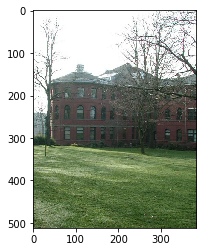

images\parrington\prtn01.jpg


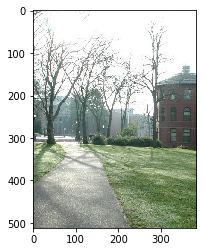

images\parrington\prtn02.jpg


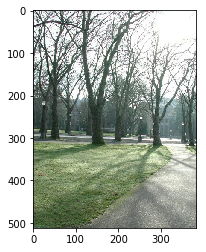

images\parrington\prtn03.jpg


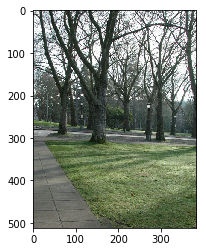

images\parrington\prtn04.jpg


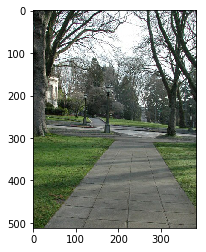

images\parrington\prtn05.jpg


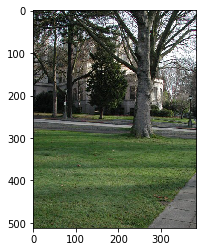

images\parrington\prtn06.jpg


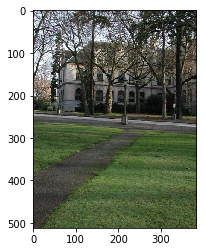

images\parrington\prtn07.jpg


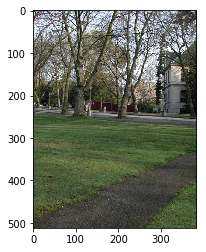

images\parrington\prtn08.jpg


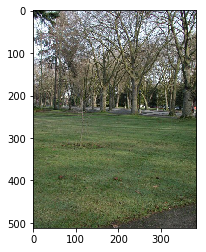

images\parrington\prtn09.jpg


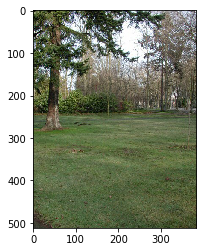

images\parrington\prtn10.jpg


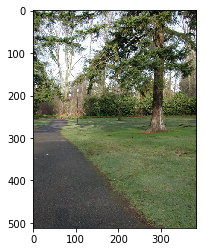

images\parrington\prtn11.jpg


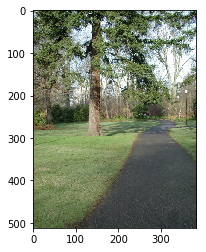

images\parrington\prtn12.jpg


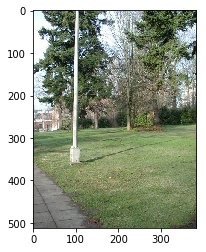

images\parrington\prtn13.jpg


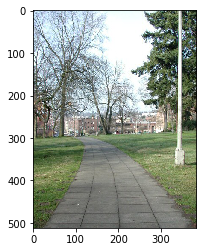

images\parrington\prtn14.jpg


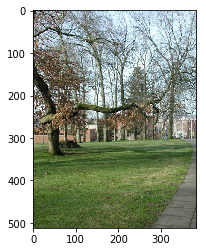

images\parrington\prtn15.jpg


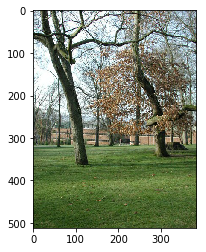

images\parrington\prtn16.jpg


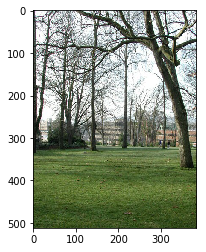

images\parrington\prtn17.jpg


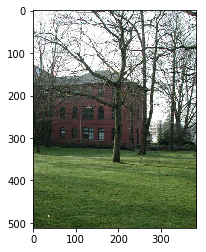

In [68]:
img_set.clear()
for img_pth in sorted(Path(data_pth).glob(f'prtn*.jpg')):
    print(img_pth)
    img = cv.imread(op.join(img_pth))
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    imshow(img)
    img_set.append(img)

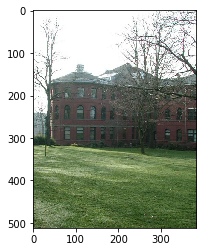

(512, 384, 3)

In [24]:
img = img_set[0]
imshow(img)
f = 706.469
img.shape

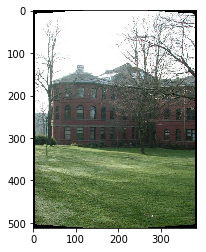

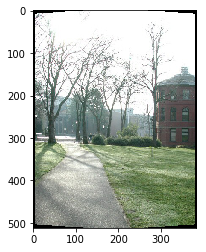

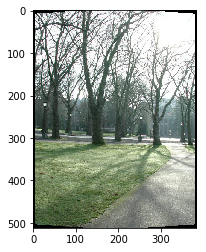

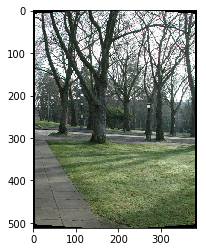

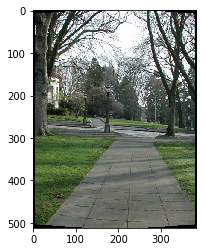

...

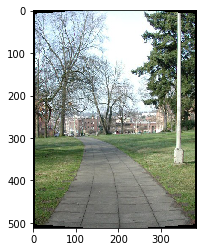

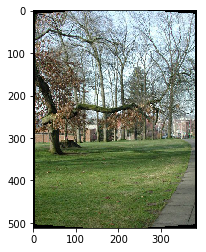

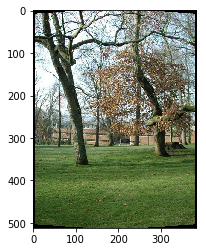

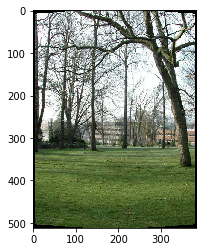

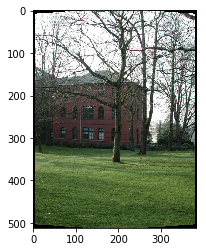

In [87]:
cy_img_set.clear()
for i, img in enumerate(img_set):
    f = focal_set[i]
    cy_img = np.zeros_like(img)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            y_tmp = int(y - img.shape[0] / 2)
            x_tmp = int(x - img.shape[1] / 2)
            y_p = int(round(f * y_tmp / math.sqrt(x_tmp**2 + f**2)) + img.shape[0] / 2)
            x_p = int(round(f * math.atan(x_tmp/f)) + img.shape[1] / 2)
            cy_img[y_p][x_p] = img[y][x]
    imshow(cy_img)
    cy_img_set.append(cy_img)